In [1]:
!pip install Unidecode
!pip install fuzzysearch

!pip install elementpath
!pip install lxml 
!pip install graphviz
!pip install pydotplus

In [1]:
!ls ../../edspdf-train/data/publaynet/

dev.json xmls


# Sorting lines based on the xml files

In [1]:
from sort_xml import *
base_dir = '../../edspdf-train/data/publaynet/'

%load_ext autoreload
%autoreload 2

import sys
sys.executable

'/export/home/smbaye/edspdf-train/.venv/bin/python'

### Load pdf and xml example 

In [4]:
!ls ../../edspdf-train/data/publaynet/xmls | head -n +25

PMC1087887
PMC1087888
PMC1241820
PMC1247186
PMC1247188
PMC1247189
PMC1247474
PMC1247478
PMC1247480
PMC1247485
PMC1247515
PMC1247517
PMC1247523
PMC1247562
PMC1247569
PMC1247570
PMC1247573
PMC1247606
PMC1247607
PMC1247608
PMC1247616
PMC1247620
PMC1247625
PMC1247658
PMC1247661


In [2]:
!ls ../../edspdf-train/data/publaynet/train/PMC1808441/

1748-7161-2-3-1.gif  1748-7161-2-3-2.jpg  1748-7161-2-3-S1.pdf	pmc_data.pkl
1748-7161-2-3-1.jpg  1748-7161-2-3-3.gif  1748-7161-2-3.nxml
1748-7161-2-3-2.gif  1748-7161-2-3-3.jpg  1748-7161-2-3.pdf


In [ ]:
PMC1247562 # exellent
PMC1247569 # exell b-37 --> (now ok)
PMC1247570 # title twice b-16, b-23
PMC1247573 # front, body et tables perfect
PMC1247606 # between b-7 and b-8, two missing nodes in the xml
PMC1247607 # body et tables perfect
PMC1247608
PMC1247616
PMC1280340 # body et tables perfect
PMC1247620 # 6min trop long
PMC1247625 # perfect (0 table)
PMC1247658 # 3min


PMC1247573 # A voir pour table

In [25]:
file_dir = base_dir + 'train/PMC2642765'
pdf_path, xml_path = get_paths(file_dir = file_dir)
print(f'xml path: {xml_path}\npdf path: {pdf_path}')
print(f'xml path: {next(Path(file_dir).glob("*.pdf"))}')

xml path: ../../edspdf-train/data/publaynet/train/PMC2642765/1754-1611-3-2.nxml
pdf path: ../../edspdf-train/data/publaynet/train/PMC2642765/1754-1611-3-2.pdf
xml path: ../../edspdf-train/data/publaynet/train/PMC2642765/1754-1611-3-2-S1.pdf


## Model extractor

In [26]:
from edspdf import Pipeline
from edspdf.structures import Box, PDFDoc
from edspdf.visualization.annotations import show_annotations

# model
model = Pipeline()
model.add_pipe("pdfminer-extractor", config=dict(extract_style="true"), name="extractor")

# Read PDF
pdf = pdf_path.read_bytes()
doc: PDFDoc = model.get_pipe("extractor")(pdf)

dict_page_text_boxes = {}
for tb in doc.content_boxes:
    if tb.page_num not in dict_page_text_boxes:
        dict_page_text_boxes[tb.page_num] = []
    dict_page_text_boxes[tb.page_num].append(tb)
print(f'Nb pages {len(dict_page_text_boxes)}')
# pages = [page for page in show_annotations(doc.content, doc.content_lines)]
# for page in show_annotations(doc.content, doc.content_boxes):
#     display(page)

Nb pages 10


#### Display XML

In [27]:
# Read XML
xml = open(xml_path, 'rb')
tree = etree.parse(xml)
# root = tree.getroot()

printXML(tree)

<!DOCTYPE article PUBLIC "-//NLM//DTD Journal Archiving and Interchange DTD v2.3 20070202//EN" "archivearticle.dtd">
<article xmlns:xlink="http://www.w3.org/1999/xlink" article-type="research-article">
  <?properties open_access?>
  <front>
    <journal-meta>
      <journal-id journal-id-type="nlm-ta">J Biol Eng</journal-id>
      <journal-title>Journal of Biological Engineering</journal-title>
      <issn pub-type="epub">1754-1611</issn>
      <publisher>
        <publisher-name>BioMed Central</publisher-name>
      </publisher>
    </journal-meta>
    <article-meta>
      <article-id pub-id-type="pmid">19187561</article-id>
      <article-id pub-id-type="pmc">2642765</article-id>
      <article-id pub-id-type="publisher-id">1754-1611-3-2</article-id>
      <article-id pub-id-type="doi">10.1186/1754-1611-3-2</article-id>
      <article-categories>
        <subj-group subj-group-type="heading">
          <subject>Research</subject>
        </subj-group>
      </article-categories>
    

#### Font, Body and tables text nodes

##### Front nodes matching

In [28]:
xml_front_nodes = get_front_nodes(tree)

print(f'\n\nNb nodes {len(xml_front_nodes)}')
for id,xml_node in enumerate(xml_front_nodes):
    printXML(xml_node)

front_nodes = []
for id,xml_node in enumerate(xml_front_nodes):
    node = Node(xml_node, id, color='yellow', bg_color='black', r0='f', entropie_threshold=0.1)
    front_nodes.append(node)
    
front_nodes = tqdm(front_nodes, mininterval=1)



Nb nodes 7
<article-title xmlns:xlink="http://www.w3.org/1999/xlink">Synthesizing non-natural parts from natural genomic template</article-title>

<contrib-groups>
  <new-name>
    <given-names>Pawan K</given-names>
    <surname>Dhar</surname>
  </new-name>
  <vigule>,</vigule>
  <xref ref-type="aff" rid="I1">1</xref>
  <new-name>
    <given-names>Chaw Su</given-names>
    <surname>Thwin</surname>
  </new-name>
  <vigule>,</vigule>
  <xref ref-type="aff" rid="I1">1</xref>
  <new-name>
    <given-names>Kyaw</given-names>
    <surname>Tun</surname>
  </new-name>
  <vigule>,</vigule>
  <xref ref-type="aff" rid="I1">1</xref>
  <new-name>
    <given-names>Yuko</given-names>
    <surname>Tsumoto</surname>
  </new-name>
  <vigule>,</vigule>
  <xref ref-type="aff" rid="I1">1</xref>
  <new-name>
    <given-names>Sebastian</given-names>
    <surname>Maurer-Stroh</surname>
  </new-name>
  <vigule>,</vigule>
  <xref ref-type="aff" rid="I2">2</xref>
  <new-name>
    <given-names>Frank</given-name

  0%|          | 0/7 [00:00<?, ?it/s]

In [29]:
for tb in doc.content_boxes:
    tb.rank = None
    tb.inode = None

In [30]:
for node in front_nodes:
    node.reset()

get_matches(front_nodes, dict_page_text_boxes, v=False)

100%|██████████| 7/7 [00:04<00:00,  1.56it/s]


In [31]:
n_tt = len(front_nodes)
n_mt = len([0 for node in front_nodes if node.full])
print(f'Front\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
for node in front_nodes:
    if not node.full:
        print(f'    {node.id}  `{node.text}`')

Front
  Nb nodes total 7
  Nb nodes matched 5
  Nb nodes not matched 2
    1  `Pawan K Dhar , 1 Chaw Su Thwin , 1 Kyaw Tun , 1 Yuko Tsumoto , 1 Sebastian Maurer-Stroh , 2 Frank Eisenhaber , 2 Uttam Surana , 3`
    3  `This is an Open Access article distributed under the terms of the Creative Commons Attribution License ( ), which permits unrestricted use, distribution, and reproduction in any medium, provided the original work is properly cited.`


In [10]:
# id = 0
# for node in front_nodes:
#     if node.id == id:
#         break

# node.print_node()

##### Body nodes matching

In [32]:
# executer une seule fois sionon erreur
# moins de noeuds retournes

qbody='//body//title | //body//p'
r = elementpath.select(tree, qbody)
r2 = []

jump = False
for i,node in enumerate(r):
    if jump:
        jump = False
        continue
    if node.tag == 'title' and r[1+i].tag == 'p':
        sec = etree.Element('sec')
        sec.append(node)
        sec.append(r[1+i])
        r2.append(sec)
        jump = True
    else:
        r2.append(node)

xml_body_nodes = r2

body_nodes = []
for id, xml_node in enumerate(xml_body_nodes):
    node = Node(xml_node, id, color='black', bg_color='cyan', r0='b')
    body_nodes.append(node)
body_nodes = tqdm(body_nodes, mininterval=1)

  0%|          | 0/29 [00:00<?, ?it/s]

In [33]:
for node in body_nodes:
    node.reset()

get_matches(body_nodes, dict_page_text_boxes, v=False)

100%|██████████| 29/29 [00:02<00:00, 12.02it/s]


In [34]:
n_tt = len(body_nodes)
n_mt = len([0 for node in body_nodes if node.full])
print(f'Body\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
for node in body_nodes:
    if not node.full:
        print(f'    {node.id}  `{node.text}`')

Body
  Nb nodes total 29
  Nb nodes matched 27
  Nb nodes not matched 2
    4  `Description of eka sequences`
    26  `Supplementary Material`


Introduction

Contex
Datset
Model


In [35]:
inode_copy = []
for tb in doc.content_boxes:
    inode_copy.append(tb.inode)

In [40]:
id = 4
for node in body_nodes:
    if node.id == id: break
printXML(node.xml_node)
node.print_node()

<p xmlns:xlink="http://www.w3.org/1999/xlink">Description of eka sequences</p>

Nb blocs 1
Node (4 not complete) text: `Description of eka sequences`
bloc 0
  Id 0 nb tbs 1
  Text: `c`
  merged ids: `{'0'}`
     0 p-2 `c` 		-> [Match(start=3, end=4, dist=0, matched='c'), Match(start=22, end=23, dist=0, matched='c')] TextBox(x0=0.43078624509803926, x1=0.43595732352941174, y0=0.15617538636363637, y1=0.16655417424242414, label=None, page_num=2, text='c', props=[TextProperties(italic=True, bold=False, begin=0, end=1, fontname='KNEPLJ+GillSans-Italic')])


In [26]:
# tbs = []
# for tb in doc.content_boxes:
#     if tb.inode is None and tb.page_num == 2:
#         print(f'`{tb.text}` {tb}')
#         tbs.append(tb)
# tb = tbs[1]

print(f'\n`{tb.text}` {tb}')


`Iv = n • d–` TextBox(x0=0.7379431176470588, x1=0.789837908496732, y0=0.7714659090909091, y1=0.7872044191919192, label=None, page_num=2, text='Iv = n • d–', props=[TextProperties(italic=False, bold=False, begin=0, end=4, fontname='AJFDFB+AGaramond-Regular'), TextProperties(italic=True, bold=False, begin=5, end=6, fontname='AJPBMF+AGaramond-Italic'), TextProperties(italic=False, bold=False, begin=7, end=11, fontname='AJFDFB+AGaramond-Regular')])


In [29]:

delete_white_spaces(unidecode(" ".join(node.xml_node.itertext()))), \
delete_white_spaces(unidecode(tb.text))

('Iv=n*[1]', 'Iv=n*d-')

##### Tables nodes matching

In [36]:
# one execution

qtables='//table-wrap'
tables_nodes=elementpath.select(tree, qtables)


qtable='//label | //caption | //tr | //table-wrap-foot'
xml_table_nodes = [
    [
        node for node in one_tns if "".join(node.itertext()) != ""
    ]
    for one_tns in [elementpath.select(table_tree, qtable) for table_tree in tables_nodes]
]

# Merging label and caption
for itable in range(len(xml_table_nodes)):
    label = None
    caption = None
    lc = None
    for ind,node in enumerate(xml_table_nodes[itable]):
        if node.tag == 'label':
            label = (ind,node)
        if node.tag == 'caption':
            caption = (ind,node)
        if label is not None and caption is not None:
            lc = etree.Element('label_caption')
            lc.append(deepcopy(label[1]))
            lc.append(deepcopy(caption[1]))
            xml_table_nodes[itable][label[0]] = lc
            xml_table_nodes[itable] = xml_table_nodes[itable][:caption[0]] + xml_table_nodes[itable][1+caption[0]:]
            break

# delete other label tags
table_nodes_ = []
for table in xml_table_nodes:
    tk_nodes = []
    for node in table:
        if node.tag != 'label':
            tk_nodes.append(node)
    table_nodes_.append(tk_nodes)
    
xml_table_nodes = table_nodes_

table_nodes = []
for itable,xml_t in enumerate(xml_table_nodes):
    t_nodes = []
    for id,xml_node in enumerate(xml_t):
        node = Node(xml_node, id, color='red', bg_color='white', r0=f't{itable}-')
        t_nodes.append(node)
    t_nodes = tqdm(t_nodes, mininterval=1)
    table_nodes.append(t_nodes)

  0%|          | 0/10 [00:00<?, ?it/s]

In [17]:
# itable = 0
# print(f'Nb nodes of table {itable}: {len(xml_table_nodes[itable])}\n')
# for inode,node in enumerate(xml_table_nodes[itable]):
#     print(f'{node.tag} {inode}\n  `{" | ".join(node.itertext())}`\n')
#     # printXML(node)
#     print('------------------')

In [47]:
# backup tb.inode
for tb,inode in zip(doc.content_boxes, inode_copy):
    tb.inode = inode
    if inode is None:
        tb.rank = None

In [48]:

# for ic,tb in zip(inode_copy,doc.content_boxes):
#     tb.inode = ic
for t_nodes in table_nodes:
    for node in t_nodes:
        node.reset()
    
    get_matches(t_nodes, dict_page_text_boxes, v=False)

# itable = 0
# _tdb = get_matches(table_nodes[itable], dict_page_text_boxes, color='red', bg_color='white',v=False, r0=f't{itable}-')

In [49]:
print(f'Nb tables {len(table_nodes)}')
for itable in range(len(table_nodes)):
    # itable = 0
    
    tk_nodes = table_nodes[itable]
    # tk_nodes_blocs, tk_dict_blocs = _tdb    #   table_dict_blocks[itable]

    n_tt = len(tk_nodes)
    n_mt = len([0 for node in tk_nodes if node.full])
    print(f'Table {itable}\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
    for node in tk_nodes:
        if not node.full:
            print(f'    {node.id}  `{node.text}`')
    
    # break

Nb tables 1
Table 0
  Nb nodes total 10
  Nb nodes matched 9
  Nb nodes not matched 1
    9  `Start-end indicates genomic location of the selected sequences. 'a' indicates the length of the original genomic insert, 'b' and 'c' indicate vector contributed prefix and suffix DNA sequences respectively. Total (a+b+c) indicates the entire DNA sequence expressed into proteins. The pBAD vector contribution to the final protein sequence is indicated in percentages. Aa indicates the number of amino acid residues of the synthesized protein. M.W. refers to the Isotopically Averaged Molecular Weight calculated in kiloDaltons (kDa). (i) indicates GC ratio of the genomic insert, and (ii) indicates GC ratio of the complete DNA sequence (vector + genomic DNA) expressed into proteins. The large e-value and extremely small bit score approaching zero (*) indicates very low sequence similarity of eka proteins to the known protein sequences.`


In [42]:
# inode never matched fails because therefore inode not in _dict_blocs
itable = 0
id = 5
tk_nodes = table_nodes[itable]

# tk_nodes_blocs, tk_dict_blocs = _tdb    #  table_dict_blocks[itable]# 
for node in tk_nodes:
    if node.id == id: break

node.print_node()

Nb blocs 31
Node (5 not complete) text: `eka3 432 348,779 - 349,210 No 381 90 903 52.1 301 33.7 6 e-04 46.2 47.0 48.6`
bloc 4
  Id 4 nb tbs 8
  Text: `eka3 - 432 - 348,779 - - 349,210 - No - 381 - 90 - 90`
  merged ids: `{'3', '4', '9', '7', '2', '0', '5', '6', '1'}`
     0 p-2 `eka3` 		-> [Match(start=0, end=4, dist=0, matched='eka3')] TextBox(x0=0.0965686274509804, x1=0.12192437254901961, y0=0.2521598484848485, y1=0.2625386363636363, label=None, page_num=2, text='eka3', props=[TextProperties(italic=False, bold=False, begin=0, end=4, fontname='KNEPLI+GillSans')])
     1 p-2 `432` 		-> [Match(start=4, end=7, dist=0, matched='432')] TextBox(x0=0.148346568627451, x1=0.16849228431372548, y0=0.2521598484848485, y1=0.2625386363636363, label=None, page_num=2, text='432', props=[TextProperties(italic=False, bold=False, begin=0, end=3, fontname='KNEPLI+GillSans')])
     2 p-2 `348,779 -` 		-> [Match(start=7, end=15, dist=0, matched='348,779-')] TextBox(x0=0.19491448039215686, x1=0.252485372549

In [90]:
for bl in node.lblocs:
# print(f'id ({bl.id}) meged_ids {bl.merged_ids} text `{bl.text}`')
    print()
    bl.print_bloc()


Id 146 nb tbs 2
Text: `1 - ,`
merged ids: `{'4', '1', '7', '6'}`
   0 p-1 `1` 		-> [Match(start=1, end=2, dist=0, matched='1')] TextBox(x0=0.15787467320261434, x1=0.16277663398692807, y0=0.2806550505050507, y1=0.28823080808080825, label=None, page_num=1, text='1', props=[TextProperties(italic=False, bold=False, begin=0, end=1, fontname='BCCMOH+AGaramond-Regular')])
   1 p-1 `,` 		-> [Match(start=2, end=3, dist=0, matched=',')] TextBox(x0=0.16338839869281047, x1=0.16686062091503268, y0=0.27507575757575764, y1=0.28580808080808084, label=None, page_num=1, text=',', props=[TextProperties(italic=False, bold=False, begin=0, end=1, fontname='BCCMOH+AGaramond-Regular')])

Id 146-0 nb tbs 2
Text: `1 - ,`
merged ids: `{'9', '4', '1', '6'}`
   0 p-1 `1` 		-> [Match(start=1, end=2, dist=0, matched='1')] TextBox(x0=0.15787467320261434, x1=0.16277663398692807, y0=0.2806550505050507, y1=0.28823080808080825, label=None, page_num=1, text='1', props=[TextProperties(italic=False, bold=False, begin=0, en

#### Ranked text boxes

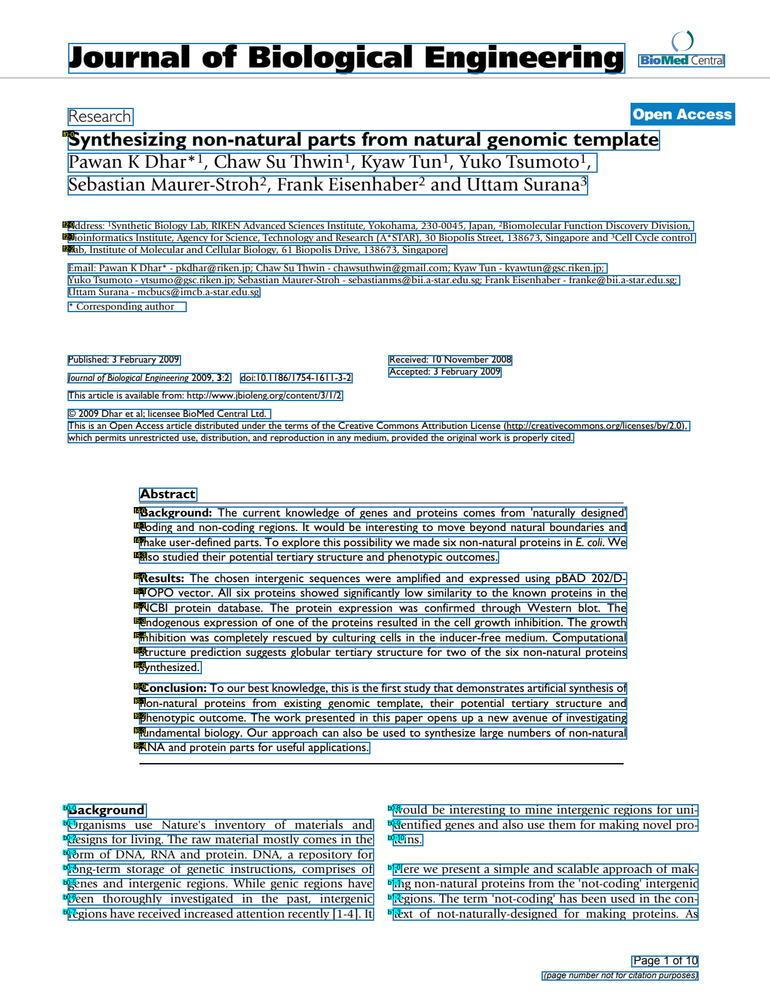

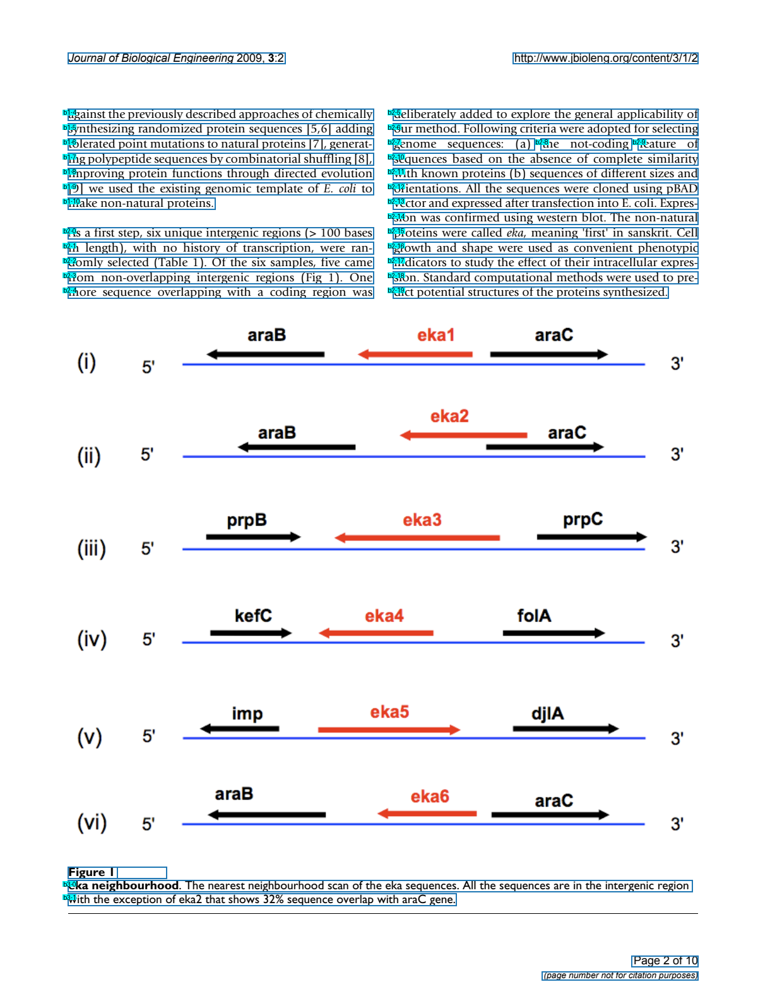

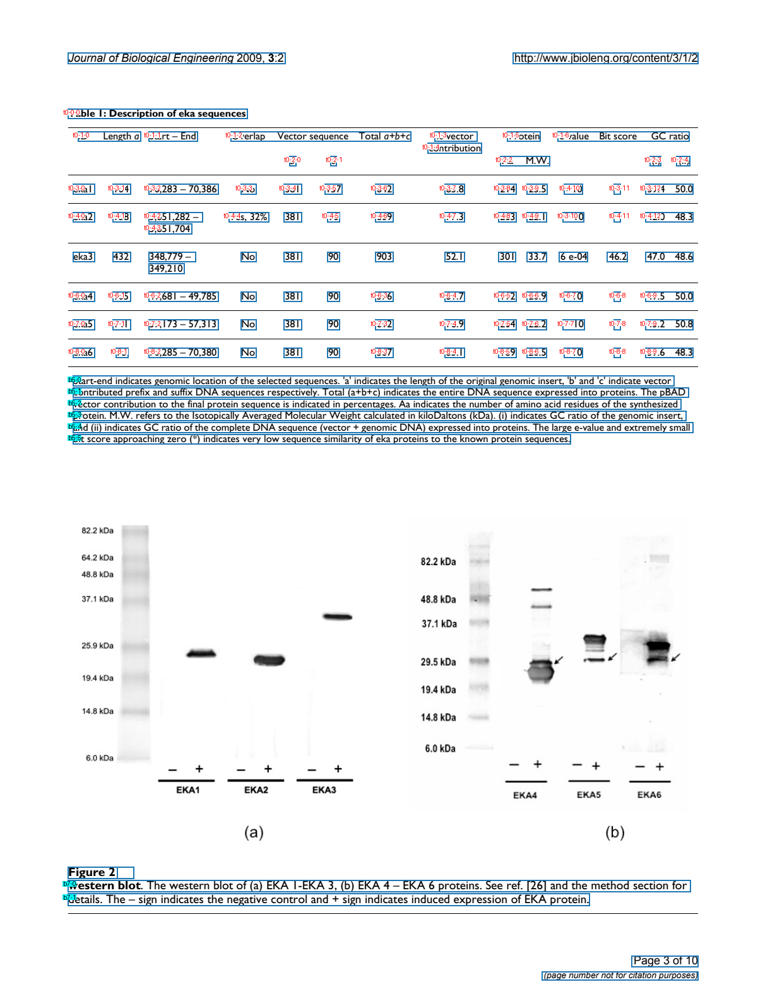

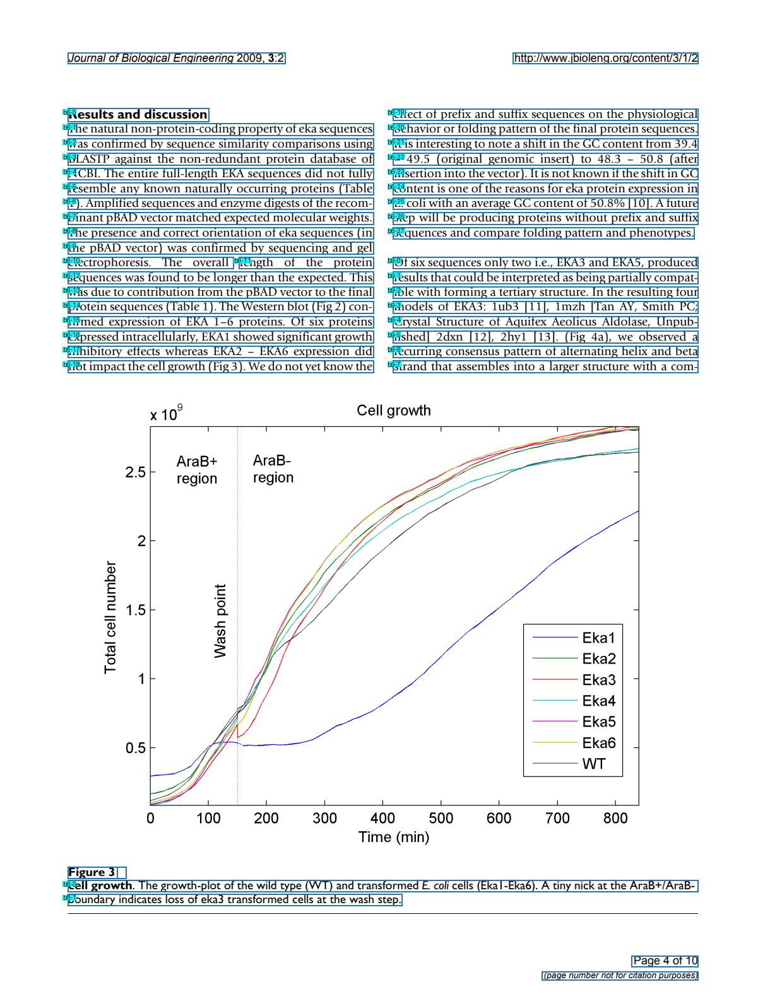

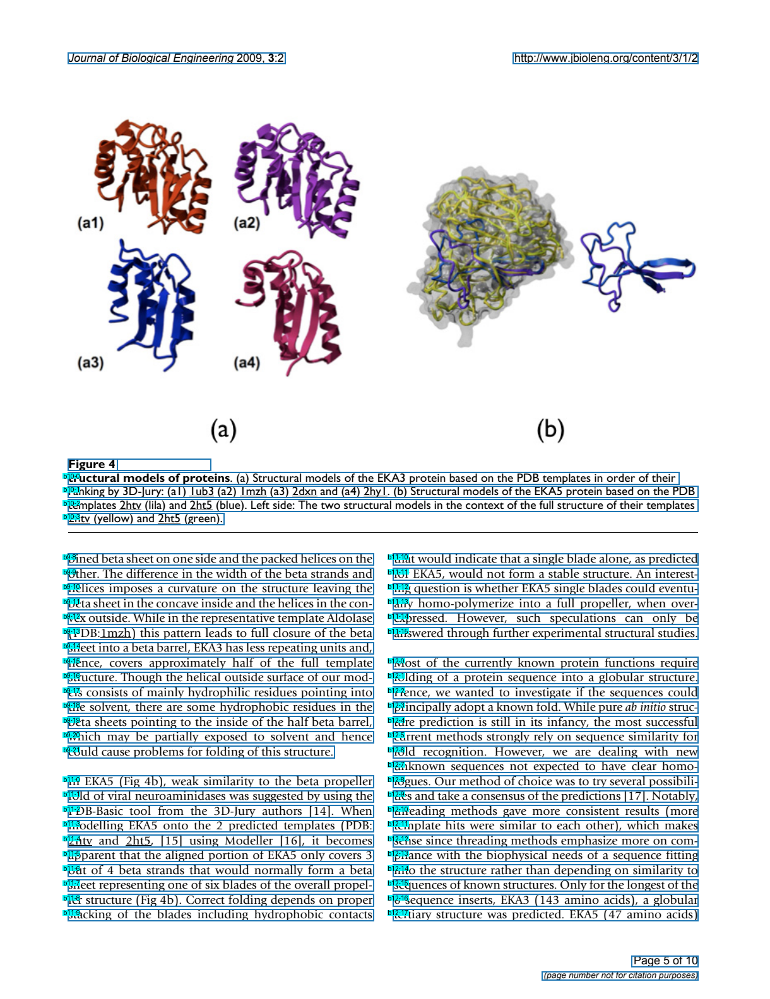

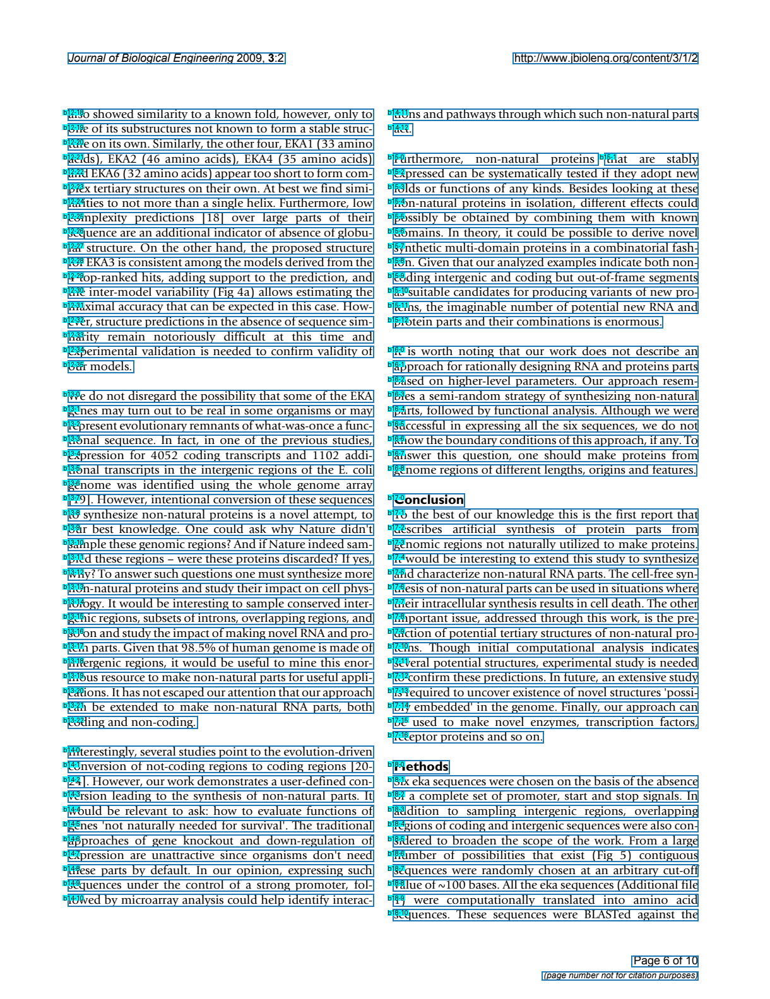

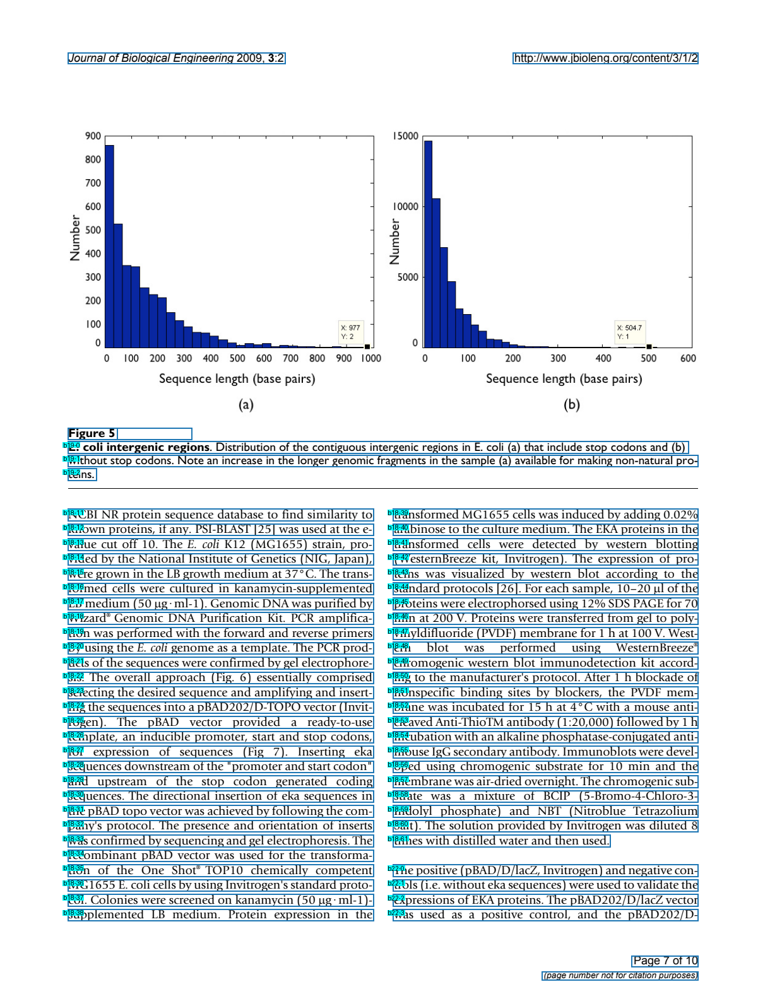

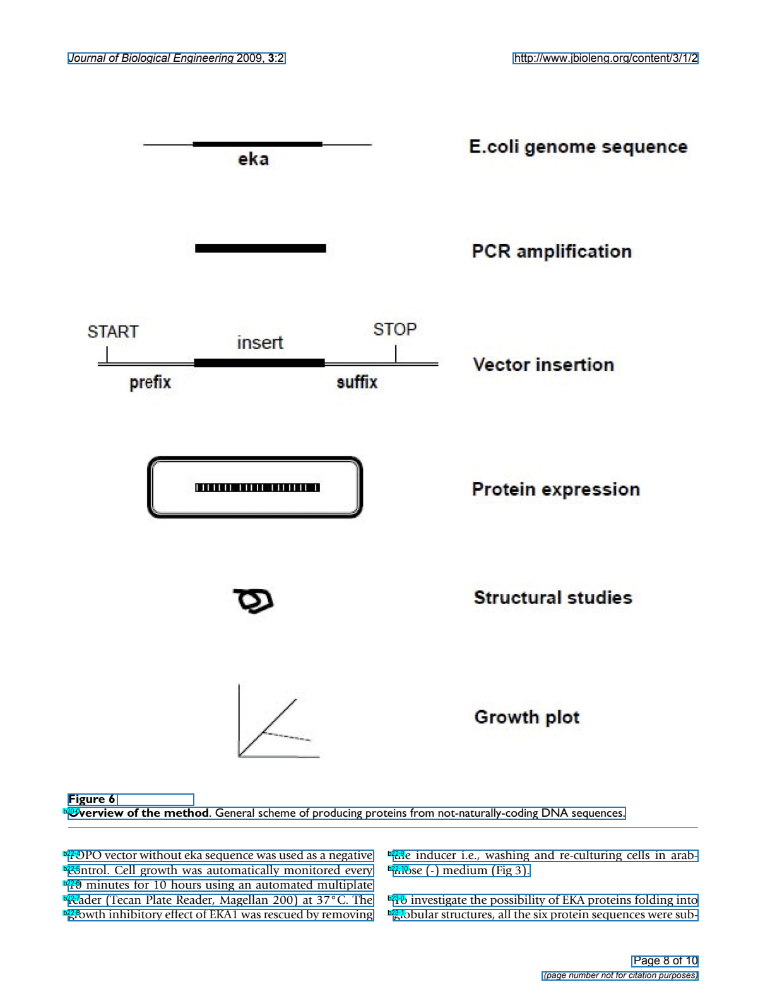

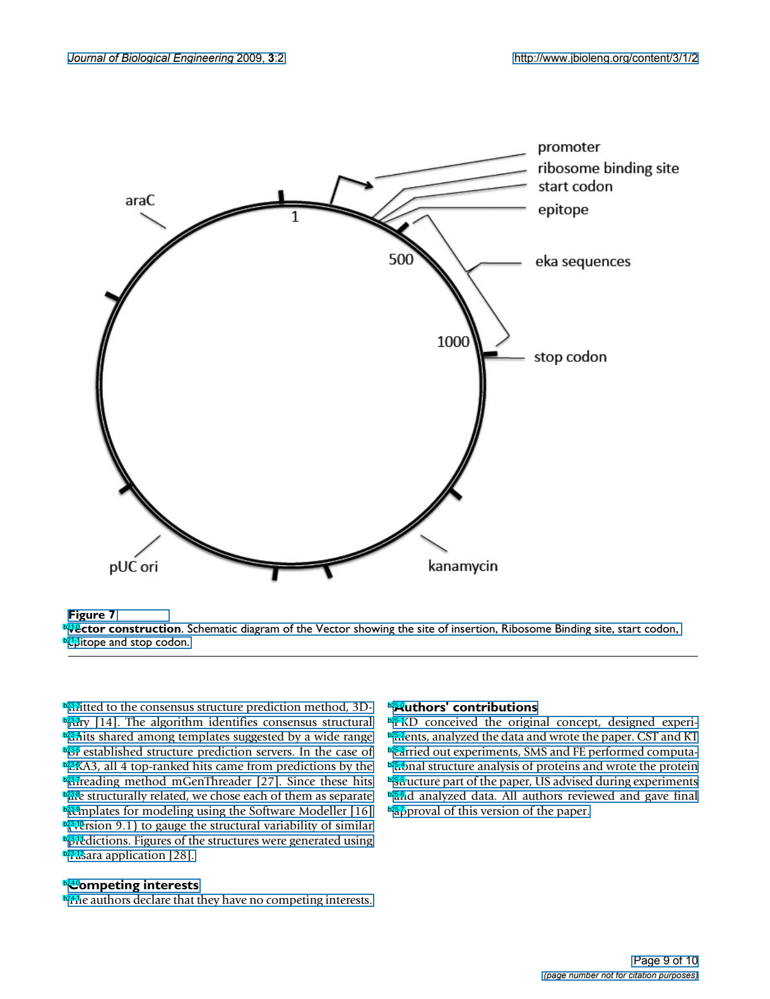

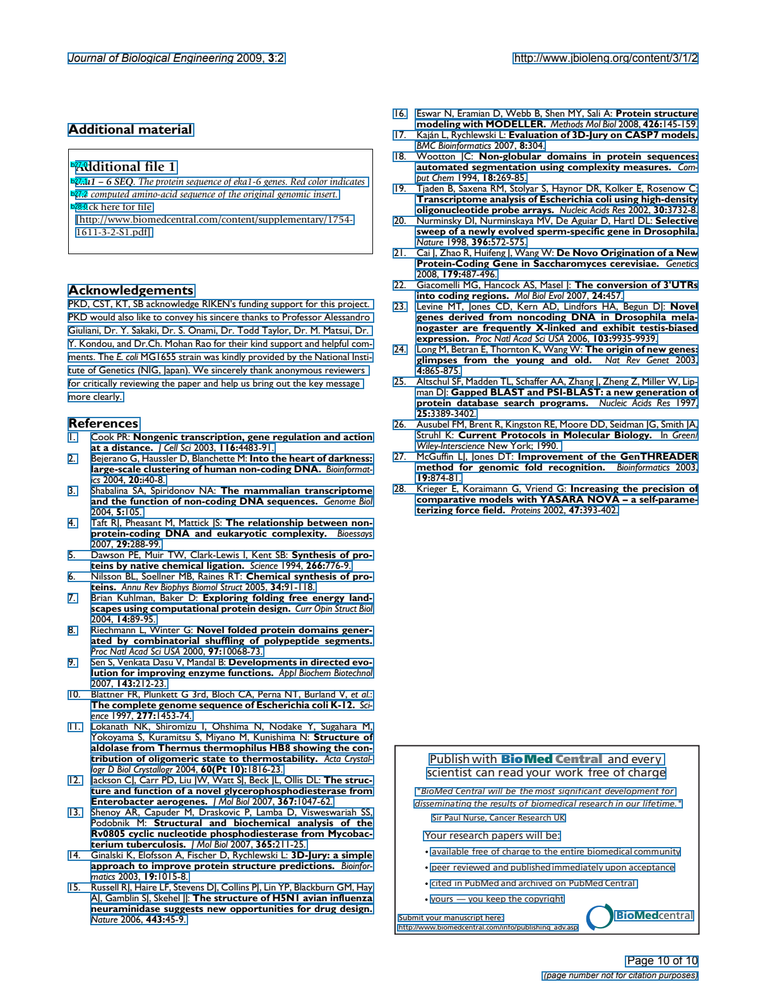

In [39]:
for page in show_annotations(doc.content, doc.content_boxes):
    display(page)